# Integrate and generate CITE-seq PBMC Datasets from scRNA-seq PBMC Datasets

The [PBMC10k](https://github.com/YosefLab/scVI-data/raw/master/pbmc_10k_protein_v3.h5ad?raw=true) and [PBMC5k](https://github.com/YosefLab/scVI-data/raw/master/pbmc_5k_protein_v3.h5ad?raw=true) CITE datasets was collected from Github. Ignore ADT measurements in the PBMC5k dataset and use only scRNA-seq data.

In [1]:
import pandas as pd
import anndata
import numpy as np
import scanpy as sc

import scproca
from scproca.model import scProca

INFO     Last run with scProca version: 0.1                                                                        


## Set global parameters

In [2]:
scproca.settings.seed = 0
scproca.settings.batch_size = 512
scproca.settings.device = 0

INFO     Setting seed 0                                                                                            
INFO     Setting batch size 512                                                                                    
INFO     Using cuda 0 device                                                                                       


In [3]:
import seaborn as sns
import torch
sc.set_figure_params(figsize=(6, 6), frameon=False)
sns.set_theme()
torch.set_float32_matmul_precision("high")

%config InlineBackend.print_figure_kwargs={'facecolor' : "w"}
%config InlineBackend.figure_format='retina'

## Load dataset from local source

In [4]:
dataset_PBMC10k = anndata.read_h5ad("../../data/PBMC/pbmc_10k_protein_v3.h5ad")
dataset_PBMC10k.obs["batch"] = "PBMC10k"

dataset_PBMC5k = anndata.read_h5ad("../../data/PBMC/pbmc_5k_protein_v3.h5ad")
dataset_PBMC5k.obs["batch"] = "PBMC5k"

## Standard data preprocessing

In [5]:
common_genes = dataset_PBMC10k.var_names.intersection(dataset_PBMC5k.var_names)
dataset_PBMC10k = dataset_PBMC10k[:, common_genes]
dataset_PBMC5k = dataset_PBMC5k[:, common_genes]
dataset_PBMC10k.obsm["protein_expression"] = pd.DataFrame(
    dataset_PBMC10k.obsm["protein_expression"],
    columns=dataset_PBMC10k.uns["protein_names"],
    index=dataset_PBMC10k.obs_names,
)
dataset_PBMC5k.obsm["protein_expression"] = pd.DataFrame(
    dataset_PBMC5k.obsm["protein_expression"],
    columns=dataset_PBMC5k.uns["protein_names"],
    index=dataset_PBMC5k.obs_names,
)
del dataset_PBMC10k.uns["protein_names"]
del dataset_PBMC5k.uns["protein_names"]

adata = anndata.concat([dataset_PBMC10k, dataset_PBMC5k], join="inner", index_unique='-')
adata.obs_names_make_unique()
adata.obsm["protein_expression"] = adata.obsm["protein_expression"].fillna(0)

/tmp/ipykernel_35382/1631958525.py:4: ImplicitModificationWarning: Setting element `.obsm['protein_expression']` of view, initializing view as actual.
  dataset_PBMC10k.obsm["protein_expression"] = pd.DataFrame(
/tmp/ipykernel_35382/1631958525.py:9: ImplicitModificationWarning: Setting element `.obsm['protein_expression']` of view, initializing view as actual.
  dataset_PBMC5k.obsm["protein_expression"] = pd.DataFrame(


## Adapt data for scProca

Ignore ADT measurements in the PBMC5k dataset and use only scRNA-seq data.

In [6]:
adata = adata[np.random.permutation(adata.n_obs)].copy()
batch = adata.obs["batch"].values.ravel()

held_out_proteins_PBMC5k = adata.obsm["protein_expression"][batch == "PBMC5k"].copy()
adata.obsm["protein_expression"].loc[batch == "PBMC5k"] = np.zeros(
    adata.obsm["protein_expression"][batch == "PBMC5k"].shape
)
adata.obs["batch_general"] = adata.obs["batch"].map({
    "PBMC10k" : "CITE-seq (PBMC10k)",
    "PBMC5k" : "scRNA-seq (PBMC5k)"
})
valid_adt = np.array([True] * len(adata))
valid_adt[batch == "PBMC5k"] = False
adata.obs["valid_adt"] = valid_adt

sc.pp.highly_variable_genes(
    adata,
    n_top_genes=4000,
    flavor="seurat_v3",
    batch_key="batch",
    subset=True
)

In [7]:
adata

AnnData object with n_obs × n_vars = 10849 × 4000
    obs: 'n_genes', 'percent_mito', 'n_counts', 'batch', 'batch_general', 'valid_adt'
    var: 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'hvg'
    obsm: 'protein_expression'

## Initialize scProca model

In [8]:
scproca_model = scProca(
    adata=adata,
    key_adt="protein_expression",
    key_batch="batch",
    key_valid_adt="valid_adt"
    )

INFO     Computing empirical prior initialization for protein background.                                          


## Train scProca model

/data/data2/xionglab/anaconda3/envs/scMuMA/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "
Training Progress:  65%|███████████▋      | 261/400 [04:26<02:21,  1.02s/it, loss_discriminator=1.94, loss_elbo=2.41e+3]

Early stopping triggered.


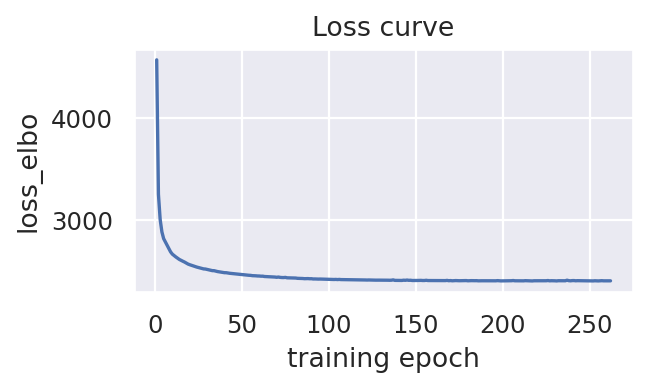

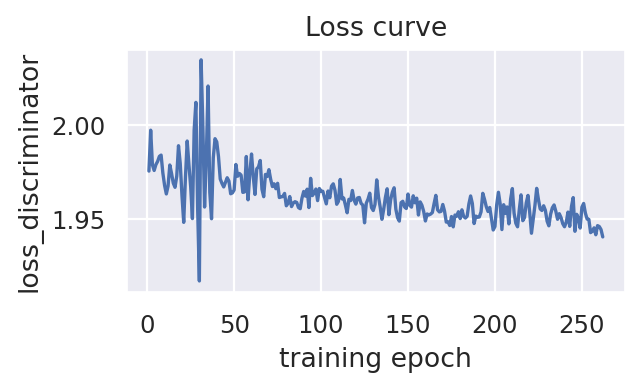

In [9]:
scproca_model.train()
scproca_model.curve_loss(key_loss="loss_elbo")
scproca_model.curve_loss(key_loss="loss_discriminator")

## Infer the integrated latent representation, RNA-specific embedding, and ADT-specific embedding for each cell

In [10]:
adata.obsm["latent"], adata.obsm["embedding_rna"], adata.obsm["embedding_adt"] = scproca_model.get_latent_representation()

Inference Progress: 100%|█████████████████████████████████████████████████████████████| 100/100 [00:13<00:00,  7.25it/s]


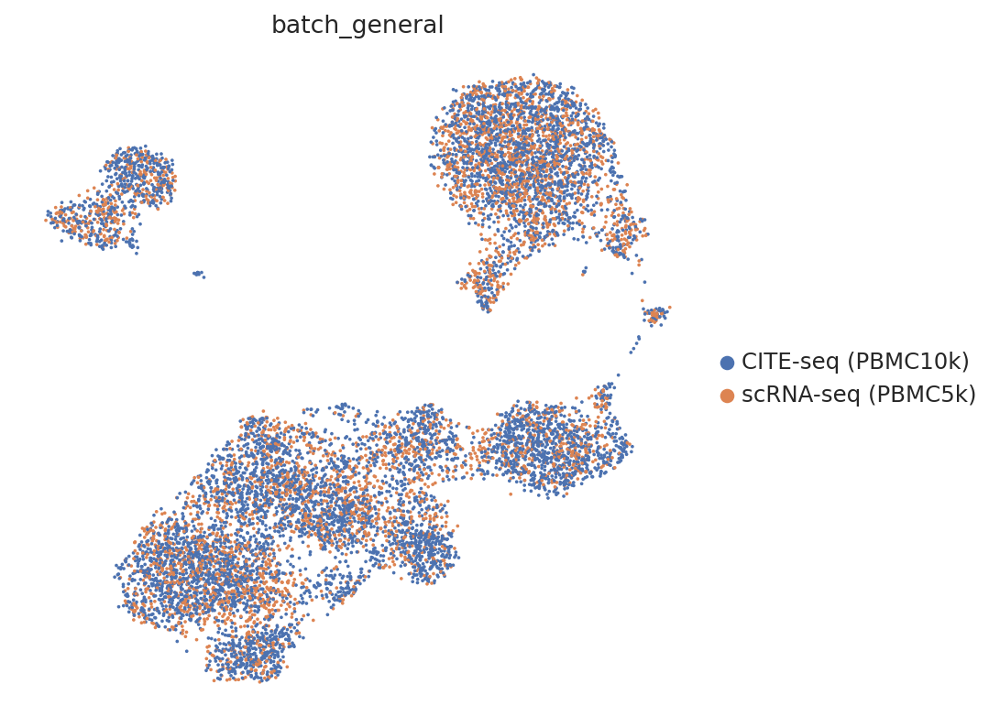

In [11]:
sc.pp.neighbors(adata, use_rep="embedding_rna")
sc.tl.umap(adata)
sc.pl.umap(
    adata,
    color="batch_general",
    frameon=False
)

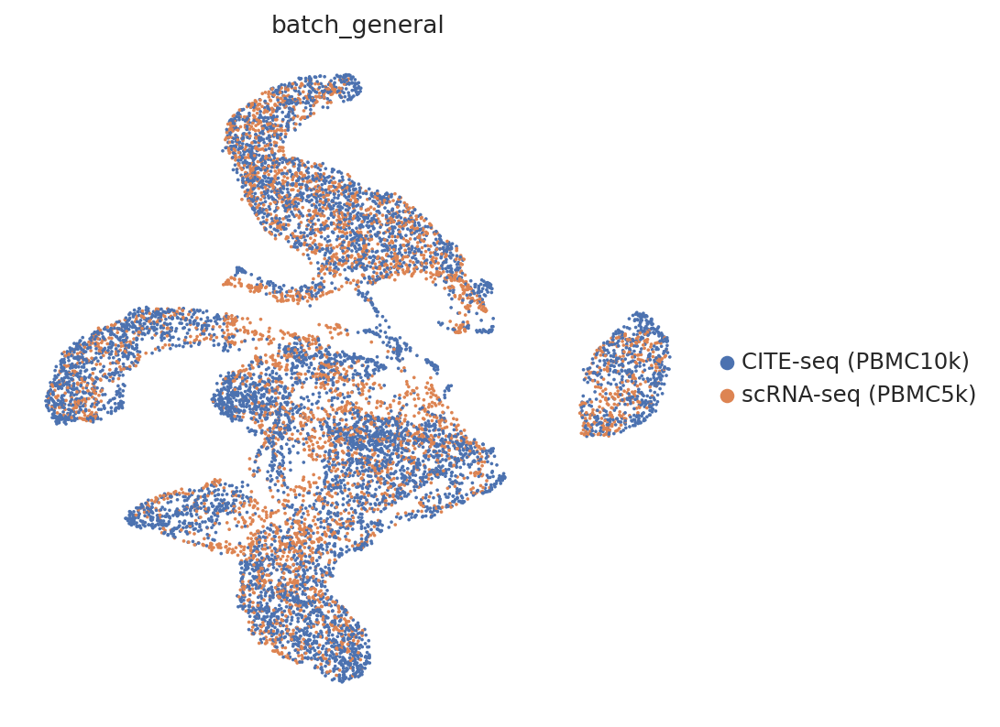

In [12]:
sc.pp.neighbors(adata, use_rep="embedding_adt")
sc.tl.umap(adata)
sc.pl.umap(
    adata,
    color="batch_general",
    frameon=False
)

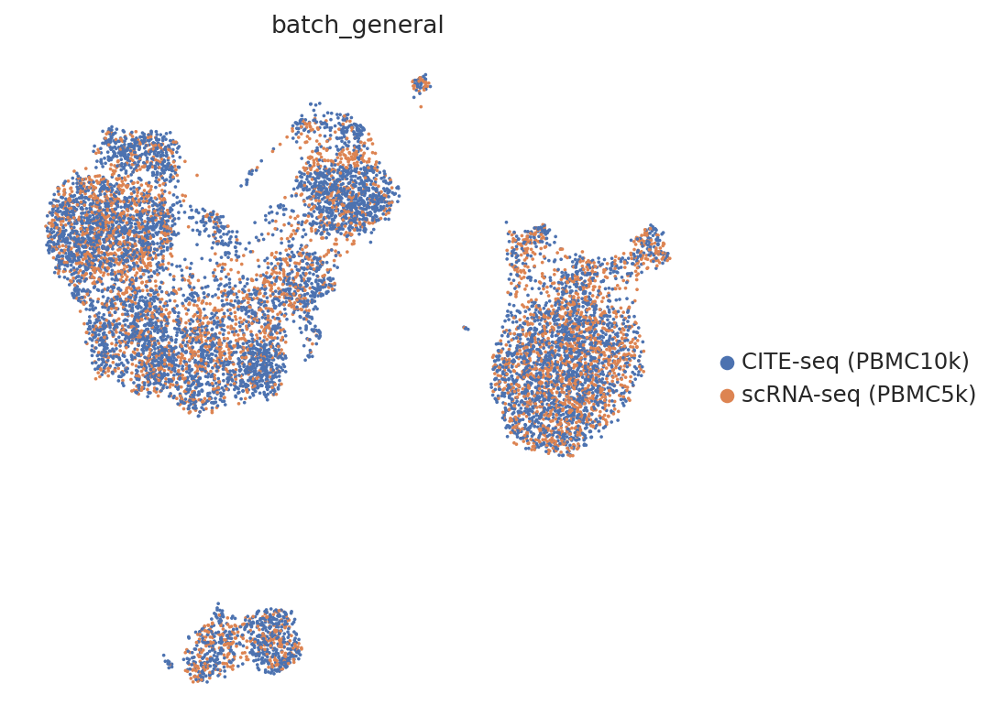

In [13]:
sc.pp.neighbors(adata, use_rep="latent")
sc.tl.umap(adata)
sc.pl.umap(
    adata,
    color="batch_general",
    frameon=False
)

## Generate ADT measurements for each cell

In [14]:
protein_generation = scproca_model.generation(anchor_batch="PBMC10k")
protein_observed = adata.obsm["protein_expression"].values.copy()
protein_observed[batch == "PBMC5k"] = held_out_proteins_PBMC5k.values

# cleaner protein names
parsed_protein_names = [
    p.split("_")[0] for p in adata.obsm["protein_expression"].columns
]
for i, p in enumerate(parsed_protein_names):
    adata.obs[f"{p} imputed"] = protein_generation[:, i]
    adata.obs[f"{p} observed"] = protein_observed[:, i]

Inference Progress: 100%|█████████████████████████████████████████████████████████████| 100/100 [00:15<00:00,  6.30it/s]


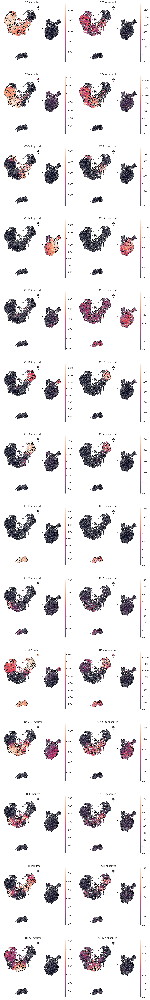

In [15]:
viz_keys = []
for p in parsed_protein_names:
    viz_keys.append(p + " imputed")
    viz_keys.append(p + " observed")

sc.pl.umap(
    adata[batch == "PBMC5k"],
    color=viz_keys,
    ncols=2,
    vmax="p99",
    frameon=False,
    add_outline=True,
    wspace=0.1,
)